In [0]:
spark

In [0]:
from pyspark.sql.types import StructType,StructField, StringType,IntegerType,BooleanType,FloatType,DateType,DecimalType
from pyspark.sql.functions import *
from pyspark.sql.window import Window

In [0]:
from pyspark.sql import SparkSession

#Create Session
spark = SparkSession.builder.appName("IPL Analysis").getOrCreate()

In [0]:

ball_by_ball_schema = StructType([
    StructField("match_id", IntegerType(), True),
    StructField("over_id", IntegerType(), True),
    StructField("ball_id", IntegerType(), True),
    StructField("innings_no", IntegerType(), True),
    StructField("team_batting", StringType(), True),
    StructField("team_bowling", StringType(), True),
    StructField("striker_batting_position", IntegerType(), True),
    StructField("extra_type", StringType(), True),
    StructField("runs_scored", IntegerType(), True),
    StructField("extra_runs", IntegerType(), True),
    StructField("wides", IntegerType(), True),
    StructField("legbyes", IntegerType(), True),
    StructField("byes", IntegerType(), True),
    StructField("noballs", IntegerType(), True),
    StructField("penalty", IntegerType(), True),
    StructField("bowler_extras", IntegerType(), True),
    StructField("out_type", StringType(), True),
    StructField("caught", BooleanType(), True),
    StructField("bowled", BooleanType(), True),
    StructField("run_out", BooleanType(), True),
    StructField("lbw", BooleanType(), True),
    StructField("retired_hurt", BooleanType(), True),
    StructField("stumped", BooleanType(), True),
    StructField("caught_and_bowled", BooleanType(), True),
    StructField("hit_wicket", BooleanType(), True),
    StructField("obstructingfeild", BooleanType(), True),
    StructField("bowler_wicket", BooleanType(), True),
    StructField("match_date", DateType(), True),
    StructField("season", IntegerType(), True),
    StructField("striker", IntegerType(), True),
    StructField("non_striker", IntegerType(), True),
    StructField("bowler", IntegerType(), True),
    StructField("player_out", IntegerType(), True),
    StructField("fielders", IntegerType(), True),
    StructField("striker_match_sk", IntegerType(), True),
    StructField("strikersk", IntegerType(), True),
    StructField("nonstriker_match_sk", IntegerType(), True),
    StructField("nonstriker_sk", IntegerType(), True),
    StructField("fielder_match_sk", IntegerType(), True),
    StructField("fielder_sk", IntegerType(), True),
    StructField("bowler_match_sk", IntegerType(), True),
    StructField("bowler_sk", IntegerType(), True),
    StructField("playerout_match_sk", IntegerType(), True),
    StructField("battingteam_sk", IntegerType(), True),
    StructField("bowlingteam_sk", IntegerType(), True),
    StructField("keeper_catch", BooleanType(), True),
    StructField("player_out_sk", IntegerType(), True),
    StructField("matchdatesk", DateType(), True)
])

In [0]:
ball_by_ball_df = spark.read.format("csv").option("header","True").option("inferSchema","True").load("s3://iplmandeep/Ball_By_Ball.csv")

In [0]:
ball_by_ball_df = spark.read.schema(ball_by_ball_schema).format("csv").option("header","True").load("s3://iplmandeep/Ball_By_Ball.csv")

In [0]:
display(ball_by_ball_df.limit(5))


match_id,over_id,ball_id,innings_no,team_batting,team_bowling,striker_batting_position,extra_type,runs_scored,extra_runs,wides,legbyes,byes,noballs,penalty,bowler_extras,out_type,caught,bowled,run_out,lbw,retired_hurt,stumped,caught_and_bowled,hit_wicket,obstructingfeild,bowler_wicket,match_date,season,striker,non_striker,bowler,player_out,fielders,striker_match_sk,strikersk,nonstriker_match_sk,nonstriker_sk,fielder_match_sk,fielder_sk,bowler_match_sk,bowler_sk,playerout_match_sk,battingteam_sk,bowlingteam_sk,keeper_catch,player_out_sk,matchdatesk
598028,15,6,1,5,2,6,No Extras,4,0,0,0,0,0,0,0,Not Applicable,null,null,null,null,null,null,null,null,null,null,null,2013,277,104,83,null,null,20336,276,20333,103,-1,-1,20343,82,-1,4,1,null,0,null
598028,14,1,1,5,2,5,No Extras,1,0,0,0,0,0,0,0,Not Applicable,null,null,null,null,null,null,null,null,null,null,null,2013,104,6,346,null,null,20333,103,20328,5,-1,-1,20348,345,-1,4,1,null,0,null
598028,14,2,1,5,2,3,No Extras,1,0,0,0,0,0,0,0,Not Applicable,null,null,null,null,null,null,null,null,null,null,null,2013,6,104,346,null,null,20328,5,20333,103,-1,-1,20348,345,-1,4,1,null,0,null
598028,14,3,1,5,2,5,No Extras,1,0,0,0,0,0,0,0,Not Applicable,null,null,null,null,null,null,null,null,null,null,null,2013,104,6,346,null,null,20333,103,20328,5,-1,-1,20348,345,-1,4,1,null,0,null
598028,14,4,1,5,2,3,No Extras,0,0,0,0,0,0,0,0,Not Applicable,null,null,null,null,null,null,null,null,null,null,null,2013,6,104,346,null,null,20328,5,20333,103,-1,-1,20348,345,-1,4,1,null,0,null


In [0]:
match_schema = StructType([
    StructField("match_sk", IntegerType(), True),
    StructField("match_id", IntegerType(), True),
    StructField("team1", StringType(), True),
    StructField("team2", StringType(), True),
    StructField("match_date", DateType(), True),
    StructField("season_year", IntegerType(), True),
    StructField("venue_name", StringType(), True),
    StructField("city_name", StringType(), True),
    StructField("country_name", StringType(), True),
    StructField("toss_winner", StringType(), True),
    StructField("match_winner", StringType(), True),
    StructField("toss_name", StringType(), True),
    StructField("win_type", StringType(), True),
    StructField("outcome_type", StringType(), True),
    StructField("manofmach", StringType(), True),
    StructField("win_margin", IntegerType(), True),
    StructField("country_id", IntegerType(), True)
])
match_df = spark.read.schema(match_schema).format("csv").option("header","true").load("s3://iplmandeep/Match.csv")


In [0]:
display(match_df.limit(5))

match_sk,match_id,team1,team2,match_date,season_year,venue_name,city_name,country_name,toss_winner,match_winner,toss_name,win_type,outcome_type,manofmach,win_margin,country_id
0,335987,Royal Challengers Bangalore,Kolkata Knight Riders,null,2008,M Chinnaswamy Stadium,Bangalore,India,Royal Challengers Bangalore,Kolkata Knight Riders,field,runs,Result,BB McCullum,140,1
1,335988,Kings XI Punjab,Chennai Super Kings,null,2008,"Punjab Cricket Association Stadium, Mohali",Chandigarh,India,Chennai Super Kings,Chennai Super Kings,bat,runs,Result,MEK Hussey,33,1
2,335989,Delhi Daredevils,Rajasthan Royals,null,2008,Feroz Shah Kotla,Delhi,India,Rajasthan Royals,Delhi Daredevils,bat,wickets,Result,MF Maharoof,9,1
3,335990,Mumbai Indians,Royal Challengers Bangalore,null,2008,Wankhede Stadium,Mumbai,India,Mumbai Indians,Royal Challengers Bangalore,bat,wickets,Result,MV Boucher,5,1
4,335991,Kolkata Knight Riders,Deccan Chargers,null,2008,Eden Gardens,Kolkata,India,Deccan Chargers,Kolkata Knight Riders,bat,wickets,Result,DJ Hussey,5,1


In [0]:
player_schema = StructType([
    StructField("player_sk", IntegerType(), True),
    StructField("player_id", IntegerType(), True),
    StructField("player_name", StringType(), True),
    StructField("dob", DateType(), True),
    StructField("batting_hand", StringType(), True),
    StructField("bowling_skill", StringType(), True),
    StructField("country_name", StringType(), True)
])

player_df = spark.read.schema(player_schema).format("csv").option("header","true").load("s3://iplmandeep/Player.csv")


In [0]:
player_match_schema = StructType([
    StructField("player_match_sk", IntegerType(), True),
    StructField("playermatch_key", DecimalType(), True),
    StructField("match_id", IntegerType(), True),
    StructField("player_id", IntegerType(), True),
    StructField("player_name", StringType(), True),
    StructField("dob", DateType(), True),
    StructField("batting_hand", StringType(), True),
    StructField("bowling_skill", StringType(), True),
    StructField("country_name", StringType(), True),
    StructField("role_desc", StringType(), True),
    StructField("player_team", StringType(), True),
    StructField("opposit_team", StringType(), True),
    StructField("season_year", IntegerType(), True),
    StructField("is_manofthematch", BooleanType(), True),
    StructField("age_as_on_match", IntegerType(), True),
    StructField("isplayers_team_won", BooleanType(), True),
    StructField("batting_status", StringType(), True),
    StructField("bowling_status", StringType(), True),
    StructField("player_captain", StringType(), True),
    StructField("opposit_captain", StringType(), True),
    StructField("player_keeper", StringType(), True),
    StructField("opposit_keeper", StringType(), True)
])

player_match_df = spark.read.schema(player_match_schema).format("csv").option("header","true").load("s3://iplmandeep/Player_match.csv")


In [0]:
team_schema = StructType([
    StructField("team_sk", IntegerType(), True),
    StructField("team_id", IntegerType(), True),
    StructField("team_name", StringType(), True)
])

team_df = spark.read.schema(team_schema).format("csv").option("header","true").load("s3://iplmandeep/Team.csv")
     

In [0]:
ball_by_ball_df = ball_by_ball_df.filter((col("wides")==0) & (col("noballs")==0))

total_and_average = ball_by_ball_df.groupBy("match_id", "innings_no").agg(
    sum("runs_scored").alias("total runs"),
    avg("runs_scored").alias("average runs")
)

In [0]:
windowSpec = Window.partitionBy("match_id","innings_no").orderBy("over_id")

ball_by_ball_df = ball_by_ball_df.withColumn(
    "running_total_runs",
    sum("runs_scored").over(windowSpec)
)

In [0]:
ball_by_ball_df = ball_by_ball_df.withColumn(
    "high_impact",
    when ((col("runs_scored")+ col("extra_runs")> 6) | (col("bowler_wicket")== True),True).otherwise(False)
)

In [0]:
display(ball_by_ball_df)

match_id,over_id,ball_id,innings_no,team_batting,team_bowling,striker_batting_position,extra_type,runs_scored,extra_runs,wides,legbyes,byes,noballs,penalty,bowler_extras,out_type,caught,bowled,run_out,lbw,retired_hurt,stumped,caught_and_bowled,hit_wicket,obstructingfeild,bowler_wicket,match_date,season,striker,non_striker,bowler,player_out,fielders,striker_match_sk,strikersk,nonstriker_match_sk,nonstriker_sk,fielder_match_sk,fielder_sk,bowler_match_sk,bowler_sk,playerout_match_sk,battingteam_sk,bowlingteam_sk,keeper_catch,player_out_sk,matchdatesk,running_total_runs,high_impact
335987,1,1,1,1,2,1,legbyes,0,1,0,1,0,0,0,0,Not Applicable,null,null,null,null,null,null,null,null,null,null,null,2008,1,2,14,null,null,12705,0,12706,1,-1,-1,12702,13,-1,0,1,null,0,null,0,false
335987,1,2,1,1,2,2,No Extras,0,0,0,0,0,0,0,0,Not Applicable,null,null,null,null,null,null,null,null,null,null,null,2008,2,1,14,null,null,12706,1,12705,0,-1,-1,12702,13,-1,0,1,null,0,null,0,false
335987,1,4,1,1,2,2,No Extras,0,0,0,0,0,0,0,0,Not Applicable,null,null,null,null,null,null,null,null,null,null,null,2008,2,1,14,null,null,12706,1,12705,0,-1,-1,12702,13,-1,0,1,null,0,null,0,false
335987,1,5,1,1,2,2,No Extras,0,0,0,0,0,0,0,0,Not Applicable,null,null,null,null,null,null,null,null,null,null,null,2008,2,1,14,null,null,12706,1,12705,0,-1,-1,12702,13,-1,0,1,null,0,null,0,false
335987,1,6,1,1,2,2,No Extras,0,0,0,0,0,0,0,0,Not Applicable,null,null,null,null,null,null,null,null,null,null,null,2008,2,1,14,null,null,12706,1,12705,0,-1,-1,12702,13,-1,0,1,null,0,null,0,false
335987,1,7,1,1,2,2,legbyes,0,1,0,1,0,0,0,0,Not Applicable,null,null,null,null,null,null,null,null,null,null,null,2008,2,1,14,null,null,12706,1,12705,0,-1,-1,12702,13,-1,0,1,null,0,null,0,false
335987,2,1,1,1,2,2,No Extras,0,0,0,0,0,0,0,0,Not Applicable,null,null,null,null,null,null,null,null,null,null,null,2008,2,1,15,null,null,12706,1,12705,0,-1,-1,12703,14,-1,0,1,null,0,null,18,false
335987,2,2,1,1,2,2,No Extras,4,0,0,0,0,0,0,0,Not Applicable,null,null,null,null,null,null,null,null,null,null,null,2008,2,1,15,null,null,12706,1,12705,0,-1,-1,12703,14,-1,0,1,null,0,null,18,false
335987,2,3,1,1,2,2,No Extras,4,0,0,0,0,0,0,0,Not Applicable,null,null,null,null,null,null,null,null,null,null,null,2008,2,1,15,null,null,12706,1,12705,0,-1,-1,12703,14,-1,0,1,null,0,null,18,false
335987,2,4,1,1,2,2,No Extras,6,0,0,0,0,0,0,0,Not Applicable,null,null,null,null,null,null,null,null,null,null,null,2008,2,1,15,null,null,12706,1,12705,0,-1,-1,12703,14,-1,0,1,null,0,null,18,false


In [0]:
display(ball_by_ball_df.where(col("high_impact") == True))

match_id,over_id,ball_id,innings_no,team_batting,team_bowling,striker_batting_position,extra_type,runs_scored,extra_runs,wides,legbyes,byes,noballs,penalty,bowler_extras,out_type,caught,bowled,run_out,lbw,retired_hurt,stumped,caught_and_bowled,hit_wicket,obstructingfeild,bowler_wicket,match_date,season,striker,non_striker,bowler,player_out,fielders,striker_match_sk,strikersk,nonstriker_match_sk,nonstriker_sk,fielder_match_sk,fielder_sk,bowler_match_sk,bowler_sk,playerout_match_sk,battingteam_sk,bowlingteam_sk,keeper_catch,player_out_sk,matchdatesk,running_total_runs,high_impact
548372,5,1,1,2,7,2,legbyes,6,1,0,1,0,0,0,0,Not Applicable,null,null,null,null,null,null,null,null,null,null,null,2012,135,79,126,null,null,19454,134,19450,78,-1,-1,19464,125,-1,1,6,null,0,null,24,true


In [0]:
from pyspark.sql.functions import year, month, dayofmonth, when

# Extracting year, month, and day from the match date for more detailed time-based analysis
match_df = match_df.withColumn("year", year("match_date"))
match_df = match_df.withColumn("month", month("match_date"))
match_df = match_df.withColumn("day", dayofmonth("match_date"))

# High margin win: categorizing win margins into 'high', 'medium', and 'low'
match_df = match_df.withColumn(
    "win_margin_category",
    when(col("win_margin") >= 100, "High")
    .when((col("win_margin") >= 50) & (col("win_margin") < 100), "Medium")
    .otherwise("Low")
)

# Analyze the impact of the toss: who wins the toss and the match
match_df = match_df.withColumn(
    "toss_match_winner",
    when(col("toss_winner") == col("match_winner"), "Yes").otherwise("No")
)

# Show the enhanced match DataFrame
display(match_df.limit(2))

match_sk,match_id,team1,team2,match_date,season_year,venue_name,city_name,country_name,toss_winner,match_winner,toss_name,win_type,outcome_type,manofmach,win_margin,country_id,year,month,day,win_margin_category,toss_match_winner
0,335987,Royal Challengers Bangalore,Kolkata Knight Riders,null,2008,M Chinnaswamy Stadium,Bangalore,India,Royal Challengers Bangalore,Kolkata Knight Riders,field,runs,Result,BB McCullum,140,1,null,null,null,High,No
1,335988,Kings XI Punjab,Chennai Super Kings,null,2008,"Punjab Cricket Association Stadium, Mohali",Chandigarh,India,Chennai Super Kings,Chennai Super Kings,bat,runs,Result,MEK Hussey,33,1,null,null,null,Low,Yes


In [0]:
from pyspark.sql.functions import lower, regexp_replace

# Normalize and clean player names
player_df = player_df.withColumn("player_name", lower(regexp_replace("player_name", "[^a-zA-Z0-9 ]", "")))

# Handle missing values in 'batting_hand' and 'bowling_skill' with a default 'unknown'
player_df = player_df.na.fill({"batting_hand": "unknown", "bowling_skill": "unknown"})

# Categorizing players based on batting hand
player_df = player_df.withColumn(
    "batting_style",
    when(col("batting_hand").contains("left"), "Left-Handed").otherwise("Right-Handed")
)

# Show the modified player DataFrame
display(player_df.limit(5))

player_sk,player_id,player_name,dob,batting_hand,bowling_skill,country_name,batting_style
0,1,sc ganguly,null,Left-hand bat,Right-arm medium,India,Right-Handed
1,2,bb mccullum,null,Right-hand bat,Right-arm medium,New Zealand,Right-Handed
2,3,rt ponting,null,Right-hand bat,Right-arm medium,Australia,Right-Handed
3,4,dj hussey,null,Right-hand bat,Right-arm offbreak,Australia,Right-Handed
4,5,mohammad hafeez,null,Right-hand bat,Right-arm offbreak,Pakistan,Right-Handed


In [0]:
from pyspark.sql.functions import col, when, current_date, expr

# Add a 'veteran_status' column based on player age
player_match_df = player_match_df.withColumn(
    "veteran_status",
    when(col("age_as_on_match") >= 35, "Veteran").otherwise("Non-Veteran")
)

# Dynamic column to calculate years since debut
player_match_df = player_match_df.withColumn(
    "years_since_debut",
    (year(current_date()) - col("season_year"))
)

# Show the enriched DataFrame
display(player_match_df.limit(5))



player_match_sk,playermatch_key,match_id,player_id,player_name,dob,batting_hand,bowling_skill,country_name,role_desc,player_team,opposit_team,season_year,is_manofthematch,age_as_on_match,isplayers_team_won,batting_status,bowling_status,player_captain,opposit_captain,player_keeper,opposit_keeper,veteran_status,years_since_debut
-1,-1,-1,-1,N/A,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,Non-Veteran,null
12694,null,335987,6,R Dravid,null,Right-hand bat,Right-arm offbreak,India,Captain,Royal Challengers Bangalore,Kolkata Knight Riders,2008,null,35,null,null,null,R Dravid,SC Ganguly,MV Boucher,WP Saha,Veteran,17
12695,null,335987,7,W Jaffer,null,Right-hand bat,Right-arm offbreak,India,Player,Royal Challengers Bangalore,Kolkata Knight Riders,2008,null,30,null,null,null,R Dravid,SC Ganguly,MV Boucher,WP Saha,Non-Veteran,17
12696,null,335987,8,V Kohli,null,Right-hand bat,Right-arm medium,India,Player,Royal Challengers Bangalore,Kolkata Knight Riders,2008,null,20,null,null,null,R Dravid,SC Ganguly,MV Boucher,WP Saha,Non-Veteran,17
12697,null,335987,9,JH Kallis,null,Right-hand bat,Right-arm fast-medium,South Africa,Player,Royal Challengers Bangalore,Kolkata Knight Riders,2008,null,33,null,null,null,R Dravid,SC Ganguly,MV Boucher,WP Saha,Non-Veteran,17


In [0]:
ball_by_ball_df.createOrReplaceTempView("ball_by_ball")
match_df.createOrReplaceTempView("match")
player_df.createOrReplaceTempView("player")
player_match_df.createOrReplaceTempView("player_match")
team_df.createOrReplaceTempView("team")
     

ball_by_ball_df.columns

['match_id',
 'over_id',
 'ball_id',
 'innings_no',
 'team_batting',
 'team_bowling',
 'striker_batting_position',
 'extra_type',
 'runs_scored',
 'extra_runs',
 'wides',
 'legbyes',
 'byes',
 'noballs',
 'penalty',
 'bowler_extras',
 'out_type',
 'caught',
 'bowled',
 'run_out',
 'lbw',
 'retired_hurt',
 'stumped',
 'caught_and_bowled',
 'hit_wicket',
 'obstructingfeild',
 'bowler_wicket',
 'match_date',
 'season',
 'striker',
 'non_striker',
 'bowler',
 'player_out',
 'fielders',
 'striker_match_sk',
 'strikersk',
 'nonstriker_match_sk',
 'nonstriker_sk',
 'fielder_match_sk',
 'fielder_sk',
 'bowler_match_sk',
 'bowler_sk',
 'playerout_match_sk',
 'battingteam_sk',
 'bowlingteam_sk',
 'keeper_catch',
 'player_out_sk',
 'matchdatesk',
 'running_total_runs',
 'high_impact']

In [0]:
top_scoring_batsmen_per_season = spark.sql("""
SELECT 
p.player_name,
m.season_year,
SUM(b.runs_scored) AS total_runs 
FROM ball_by_ball b
JOIN match m ON b.match_id = m.match_id   
JOIN player_match pm ON m.match_id = pm.match_id AND b.striker = pm.player_id     
JOIN player p ON p.player_id = pm.player_id
GROUP BY p.player_name, m.season_year
ORDER BY m.season_year, total_runs DESC
""")


display(top_scoring_batsmen_per_season)


player_name,season_year,total_runs
se marsh,2008,614
g gambhir,2008,532
st jayasuriya,2008,508
sr watson,2008,463
gc smith,2008,437
ac gilchrist,2008,431
yk pathan,2008,430
sk raina,2008,420
ms dhoni,2008,414
v sehwag,2008,399


In [0]:
economical_bowlers_powerplay = spark.sql("""
SELECT 
p.player_name, 
AVG(b.runs_scored) AS avg_runs_per_ball, 
COUNT(b.bowler_wicket) AS total_wickets
FROM ball_by_ball b
JOIN player_match pm ON b.match_id = pm.match_id AND b.bowler = pm.player_id
JOIN player p ON pm.player_id = p.player_id
WHERE b.over_id <= 6
GROUP BY p.player_name
HAVING COUNT(*) >= 1
ORDER BY avg_runs_per_ball, total_wickets DESC
""")
display(economical_bowlers_powerplay)

player_name,avg_runs_per_ball,total_wickets
sm harwood,0.3333333333333333,0
aj finch,0.5,0
a zampa,0.5,0
avesh khan,0.5,0
gr napier,0.5,0
ankit soni,0.5,0
nb singh,0.5833333333333334,0
ag murtaza,0.6538461538461539,0
d du preez,0.6666666666666666,0
s gopal,0.6666666666666666,0


In [0]:
toss_impact_individual_matches = spark.sql("""
SELECT m.match_id, m.toss_winner, m.toss_name, m.match_winner,
       CASE WHEN m.toss_winner = m.match_winner THEN 'Won' ELSE 'Lost' END AS match_outcome
FROM match m
WHERE m.toss_name IS NOT NULL
ORDER BY m.match_id
""")
display(toss_impact_individual_matches)

match_id,toss_winner,toss_name,match_winner,match_outcome
335987,Royal Challengers Bangalore,field,Kolkata Knight Riders,Lost
335988,Chennai Super Kings,bat,Chennai Super Kings,Won
335989,Rajasthan Royals,bat,Delhi Daredevils,Lost
335990,Mumbai Indians,bat,Royal Challengers Bangalore,Lost
335991,Deccan Chargers,bat,Kolkata Knight Riders,Lost
335992,Kings XI Punjab,bat,Rajasthan Royals,Lost
335993,Deccan Chargers,bat,Delhi Daredevils,Lost
335994,Mumbai Indians,field,Chennai Super Kings,Lost
335995,Rajasthan Royals,field,Rajasthan Royals,Won
335996,Mumbai Indians,field,Kings XI Punjab,Lost


In [0]:
average_runs_in_wins = spark.sql("""
SELECT p.player_name, AVG(b.runs_scored) AS avg_runs_in_wins, COUNT(*) AS innings_played
FROM ball_by_ball b
JOIN player_match pm ON b.match_id = pm.match_id AND b.striker = pm.player_id
JOIN player p ON pm.player_id = p.player_id
JOIN match m ON pm.match_id = m.match_id
WHERE m.match_winner = pm.player_team
GROUP BY p.player_name
ORDER BY avg_runs_in_wins ASC
""")
display(average_runs_in_wins)

player_name,avg_runs_in_wins,innings_played
j theron,0.0,1
anirudh singh,0.0,1
i sharma,0.0,1
a nehra,0.0,2
jj bumrah,0.0,2
ts mills,0.0,3
kp appanna,0.0,1
sn thakur,0.0,2
vr aaron,0.0,5
t thushara,0.2,5


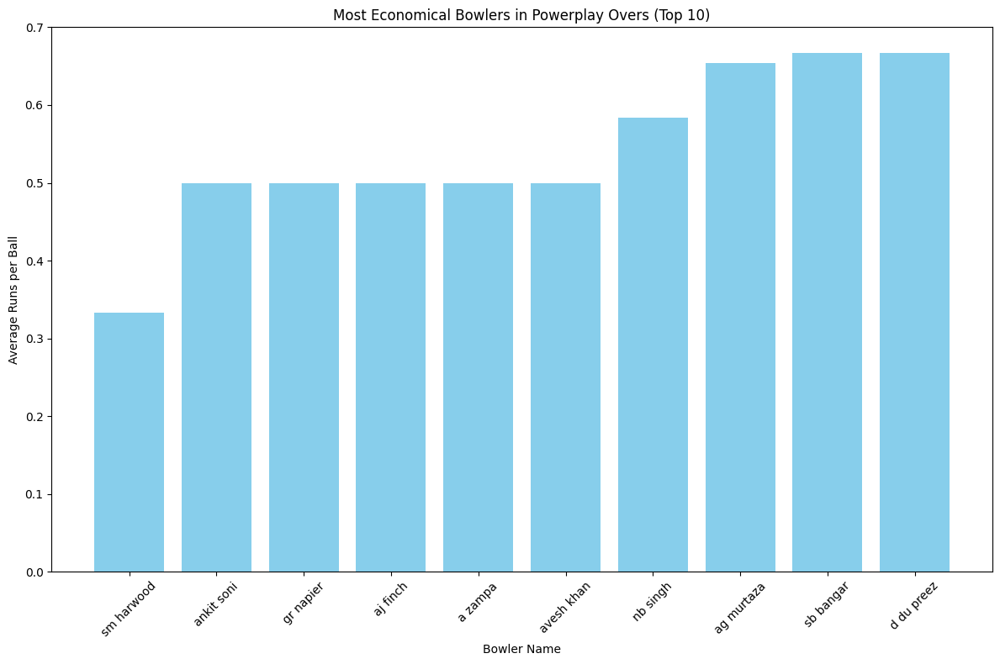

In [0]:
import matplotlib.pyplot as plt
     

# Assuming 'economical_bowlers_powerplay' is already executed and available as a Spark DataFrame
economical_bowlers_pd = economical_bowlers_powerplay.toPandas()

# Visualizing using Matplotlib
plt.figure(figsize=(12, 8))
# Limiting to top 10 for clarity in the plot
top_economical_bowlers = economical_bowlers_pd.nsmallest(10, 'avg_runs_per_ball')
plt.bar(top_economical_bowlers['player_name'], top_economical_bowlers['avg_runs_per_ball'], color='skyblue')
plt.xlabel('Bowler Name')
plt.ylabel('Average Runs per Ball')
plt.title('Most Economical Bowlers in Powerplay Overs (Top 10)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

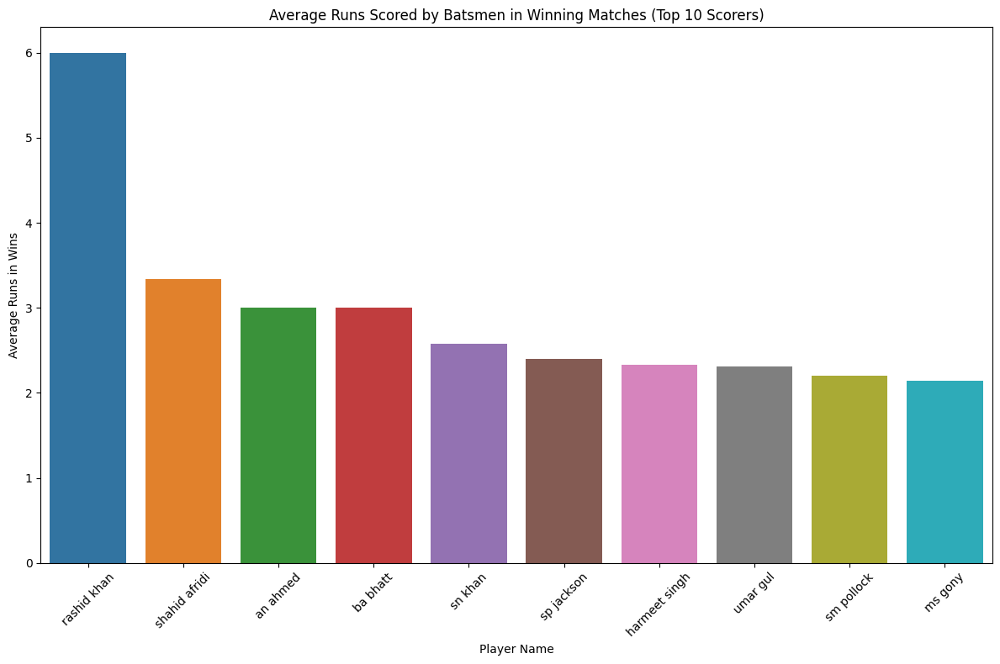

In [0]:
import seaborn as sns
average_runs_pd = average_runs_in_wins.toPandas()

# Using seaborn to plot average runs in winning matches
plt.figure(figsize=(12, 8))
top_scorers = average_runs_pd.nlargest(10, 'avg_runs_in_wins')
sns.barplot(x='player_name', y='avg_runs_in_wins', data=top_scorers)
plt.title('Average Runs Scored by Batsmen in Winning Matches (Top 10 Scorers)')
plt.xlabel('Player Name')
plt.ylabel('Average Runs in Wins')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

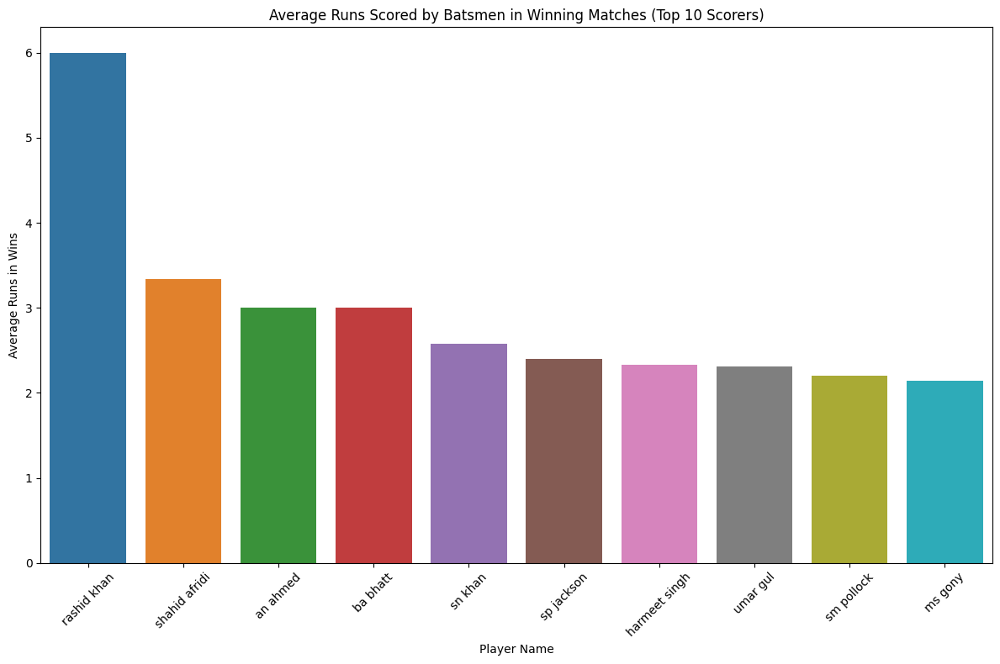

In [0]:
average_runs_pd = average_runs_in_wins.toPandas()

# Using seaborn to plot average runs in winning matches
plt.figure(figsize=(12, 8))
top_scorers = average_runs_pd.nlargest(10, 'avg_runs_in_wins')
sns.barplot(x='player_name', y='avg_runs_in_wins', data=top_scorers)
plt.title('Average Runs Scored by Batsmen in Winning Matches (Top 10 Scorers)')
plt.xlabel('Player Name')
plt.ylabel('Average Runs in Wins')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


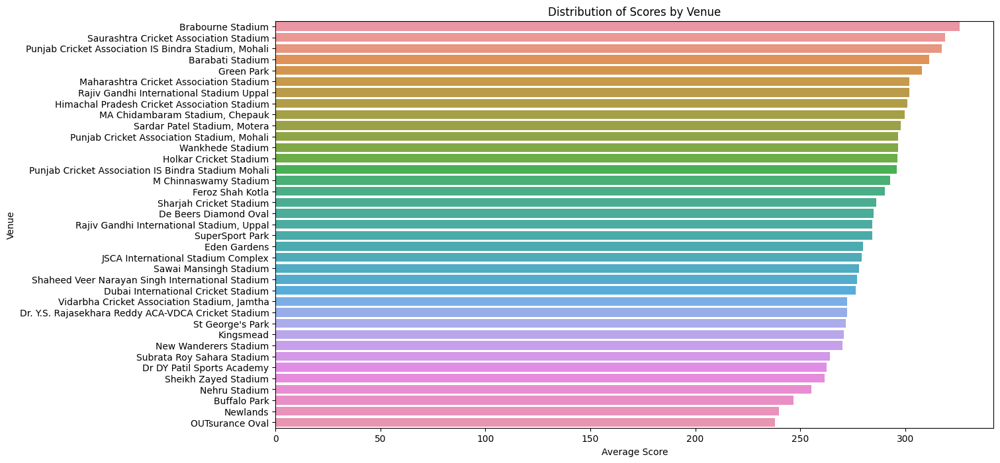

In [0]:
scores_by_venue = spark.sql("""
SELECT venue_name, AVG(total_runs) AS average_score, MAX(total_runs) AS highest_score
FROM (
    SELECT ball_by_ball.match_id, match.venue_name, SUM(runs_scored) AS total_runs
    FROM ball_by_ball
    JOIN match ON ball_by_ball.match_id = match.match_id
    GROUP BY ball_by_ball.match_id, match.venue_name
)
GROUP BY venue_name
ORDER BY average_score DESC
""")

     

# Convert to Pandas DataFrame
scores_by_venue_pd = scores_by_venue.toPandas()

# Plot
plt.figure(figsize=(14, 8))
sns.barplot(x='average_score', y='venue_name', data=scores_by_venue_pd)
plt.title('Distribution of Scores by Venue')
plt.xlabel('Average Score')
plt.ylabel('Venue')
plt.show()
     

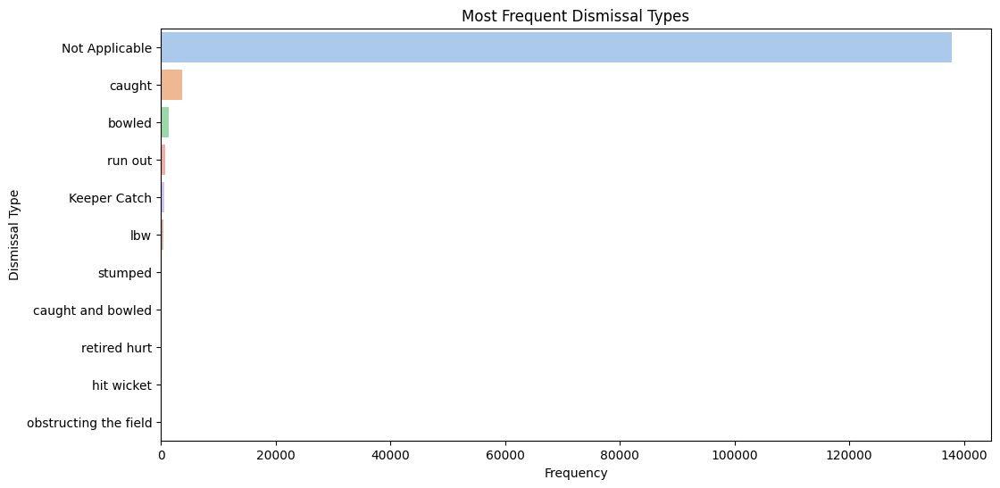

In [0]:
dismissal_types = spark.sql("""
SELECT out_type, COUNT(*) AS frequency
FROM ball_by_ball
WHERE out_type IS NOT NULL
GROUP BY out_type
ORDER BY frequency DESC
""")

     


# Convert to Pandas DataFrame
dismissal_types_pd = dismissal_types.toPandas()

# Plot
plt.figure(figsize=(12, 6))
sns.barplot(x='frequency', y='out_type', data=dismissal_types_pd, palette='pastel')
plt.title('Most Frequent Dismissal Types')
plt.xlabel('Frequency')
plt.ylabel('Dismissal Type')
plt.show()

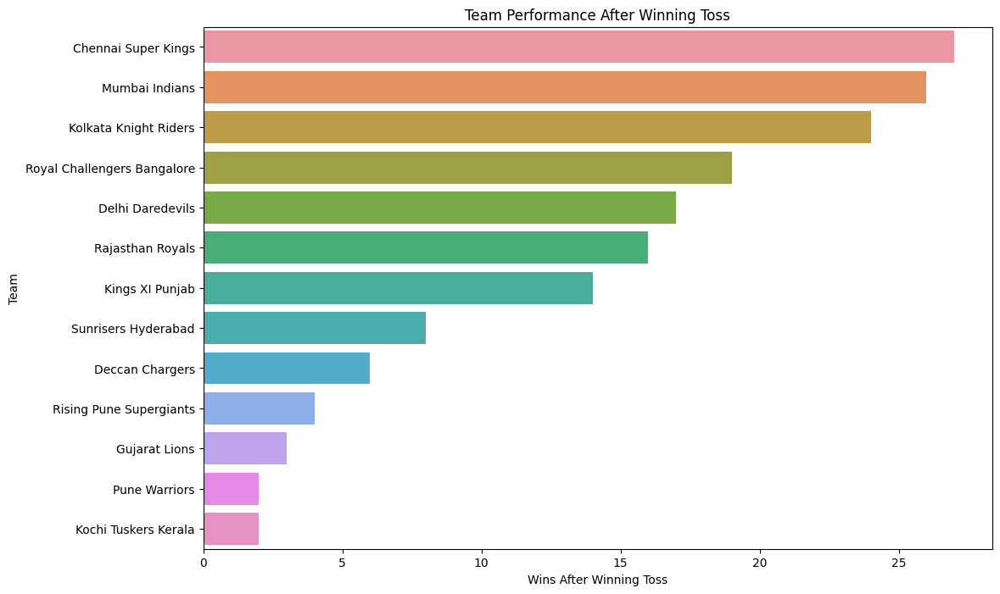

In [0]:
team_toss_win_performance = spark.sql("""
SELECT team1, COUNT(*) AS matches_played, SUM(CASE WHEN toss_winner = match_winner THEN 1 ELSE 0 END) AS wins_after_toss
FROM match
WHERE toss_winner = team1
GROUP BY team1
ORDER BY wins_after_toss DESC
""")

     


# Convert to Pandas DataFrame
team_toss_win_pd = team_toss_win_performance.toPandas()

# Plot
plt.figure(figsize=(12, 8))
sns.barplot(x='wins_after_toss', y='team1', data=team_toss_win_pd)
plt.title('Team Performance After Winning Toss')
plt.xlabel('Wins After Winning Toss')
plt.ylabel('Team')
plt.show()
